# Calibrating AL efficacy to different weights/weight groups

In [1]:
import subprocess
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolacors
from timeit import default_timer as timer
from matplotlib.ticker import MaxNLocator
import pickle
from tqdm import tqdm  # For progress bar
from multiprocessing import Pool, cpu_count

<br>

# Weights 6 to 60 in increments of 1kg (55 different weights)
## n = 10k

In [28]:
# Checking if we are in the correct directory
#wd()

# Define the range for weight groups
min_weight = 6
max_weight = 60

# Define pmax_art values
weight_values = list(range(min_weight, max_weight+1, 1))
print(weight_values)
print(len(weight_values))

#Saving EC50_lum for future reference
np.savetxt('pkpd_AL_weight_calibration_weight_range_01.txt', weight_values, delimiter=',', fmt='%5f')

# Initialize a grid to store the clearance rates
trial_efficacy = np.zeros(len(weight_values))



[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60]
55


In [29]:
def run_simulation(idx, weight):
    command_weight = [
        "/home/venitha_b/Projects/2019-test-ppq-pk/build/run_ppq_pk",
        "--AL",
        "-n", "10000",
        "--weight", str(weight),
        "-o", "1"
    ]

    try:
        # Run the command and capture output
        output_weight = subprocess.run(command_weight, capture_output=True, text=True, check=True)

        # Process the output
        lines_weight = output_weight.stdout.splitlines()
        df_weight = pd.DataFrame([line.split(',') for line in lines_weight], columns=["PID", "HOUR", "COMP2CONC_ART", "COMP2CONC_LUM", "PARASITEDENSITY"])
        
        # Clean the DataFrame
        df_weight = df_weight.iloc[1:].apply(pd.to_numeric, errors='coerce')

        # Calculate the efficacy
        failed_treatment_count = df_weight[(df_weight['PARASITEDENSITY'] >= 10)].shape[0]
        total_patients = df_weight['PID'].nunique()
        efficacy = (100 - ((failed_treatment_count / total_patients) * 100)) if total_patients > 0 else 0

        return (idx, efficacy)

    except subprocess.CalledProcessError as e:
        print(f"Error in subprocess for weight: {weight}: {e}")
        return (idx, np.nan)  # Return NaN in case of failure
    except Exception as e:
        print(f"An unexpected error occurred for pmax_art: {weight}: {e}")
        return (idx, np.nan)  # Return NaN in case of failure

# Define number of workers (use all available CPU cores)
num_workers = cpu_count()

# Prepare a list of parameters to pass to the pool
params_list = [(i, weight_values[i]) for i in range(len(weight_values))]

# Run simulations in parallel and track progress
with Pool(processes=num_workers) as pool:
    results = []
    with tqdm(total=len(params_list), desc="Running simulations") as pbar:
        for result in pool.starmap(run_simulation, params_list):
            results.append(result)
            pbar.update(1)  # Update progress bar after each result

# Update the clearance_rates array with the results
for idx, efficacy in results:
    trial_efficacy[idx] = efficacy

# Create a DataFrame with pmax_values and clearance_rates
df = pd.DataFrame({
    'weight': weight_values,
    'efficacy': trial_efficacy
})

# Save the DataFrame to a pickle file
df.to_pickle("pkpd_AL_weight_calibration_01.pyobj")

# Save the DataFrame to a CSV file
df.to_csv("pkpd_AL_weight_calibration_01.csv", index=False)

print("DataFrame saved as pickle and CSV files successfully.")

Running simulations: 100%|██████████| 55/55 [37:26<00:00, 40.85s/it]    

DataFrame saved as pickle and CSV files successfully.


In [30]:
df

,weight,efficacy
0,6,3.59
1,7,3.88
2,8,4.15
3,9,4.41
4,10,4.75
5,11,5.00
6,12,5.13
7,13,5.26
8,14,14.36
9,15,14.24


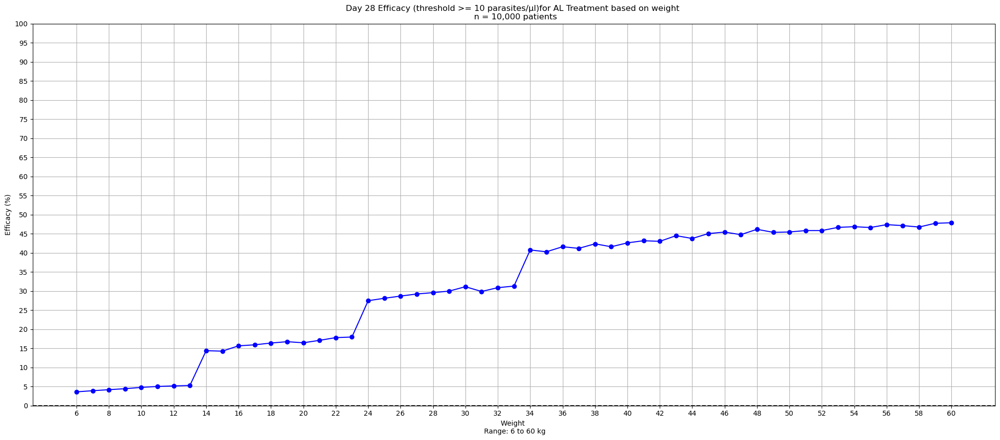

In [31]:
plt.figure(figsize=(25, 10))  # Adjust the figure size as needed
plt.plot(weight_values, trial_efficacy, marker='o', linestyle='-', color='b')
plt.xlabel('Weight \n Range: 6 to 60 kg')
plt.ylabel('Efficacy (%)')
plt.title("Day 28 Efficacy (threshold >= 10 parasites/μl)for AL Treatment based on weight \n n = 10,000 patients")
plt.grid(True)
plt.xticks(np.arange(min(weight_values), max(weight_values)+1, 2))  # Adjust tick marks if necessary
plt.yticks(np.arange(0, 101, 5))  # Y-axis ticks from 0 to 100%
plt.axhline(y=0, color='k', linestyle='--')  # Optional: horizontal line at y=0
plt.savefig("pkpd_AL_weight_calibration_01.png")  # Save the plot as a PNG file
plt.show()

<br>

# Repeating the experiment for weight groups 0-4, 5-7, 8-10, 11-16, 17 to 24 and 25 to 35

# Plotting the concentration-time, time-effect and concentration-effect graphs

# 1 tablet of dha = 40 mg, 1 tablet of lum = 120 mg

In [2]:
import subprocess
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolacors
from timeit import default_timer as timer
from matplotlib.ticker import MaxNLocator
import pickle
from tqdm import tqdm  # For progress bar
from multiprocessing import Pool, cpu_count

### Weight group 0-4 (0 tablets/ 0mg of dha, 0 tablets/ 0mg of lum)

#### Not included 0kg as it results in NaN, however code has been edited to handle 0kg

In [3]:
# Checking if we are in the correct directory
#wd()

# Define the range for weight groups
min_weight = 1
max_weight = 4

# Define values
weight_values = list(range(min_weight, max_weight+1, 1))

# Prepare a list of parameters to pass to the pool
params_list = [(i, weight_values[i]) for i in range(len(weight_values))]

# Initialize a grid to store the clearance rates
trial_efficacy = np.zeros(len(weight_values))

# Initialize a list to store the DataFrames
dataframes_results = []

print(weight_values)
print(len(weight_values))

#Saving weights for future reference
np.savetxt('pkpd_AL_weight_calibration_weight_range_group_01.txt', weight_values, delimiter=',', fmt='%5f')



[1, 2, 3, 4]
4


In [4]:
import subprocess
import pandas as pd
import numpy as np
from multiprocessing import Pool, cpu_count
from tqdm import tqdm
import matplotlib.pyplot as plt

# Function to run a single simulation for a given weight value
def run_simulation(idx, weight):
    command_weight = [
        "/home/venitha_b/Projects/2019-test-ppq-pk/build/run_ppq_pk",
        "--AL",
        "-n", "1000",
        "--weight", str(weight)
    ]

    try:
        # Run the command and capture output
        output_weight = subprocess.run(command_weight, capture_output=True, text=True, check=True)

        # Process the output
        lines_weight = output_weight.stdout.splitlines()
        df_weight = pd.DataFrame([line.split(',') for line in lines_weight], columns=["PID", "HOUR", "COMP2CONC_ART", "COMP2CONC_LUM", "PARASITEDENSITY"])
        
        # Clean the DataFrame
        df_weight = df_weight.iloc[1:].apply(pd.to_numeric, errors='coerce')

        # Save the DataFrame to a CSV file
        df_weight.to_csv(f"df_weight_group_01_run_{idx+1}.csv", index=False)

        # Calculate the efficacy
        if df_weight['PARASITEDENSITY'].isna().any():
            failed_treatment_count = np.nan
        else:
            failed_treatment_count = df_weight[(df_weight['PARASITEDENSITY'] >= 10) & (df_weight['HOUR'] == 671.0)].shape[0]
        
        total_patients = df_weight['PID'].nunique()
        
        if total_patients == 0 or np.isnan(failed_treatment_count): 
            efficacy = np.nan
        else:
            efficacy = (100 - ((failed_treatment_count / total_patients) * 100))
            if np.isnan(efficacy):
                efficacy = np.nan
        return (idx, efficacy, df_weight, failed_treatment_count)

    except subprocess.CalledProcessError as e:
        print(f"Error in subprocess for weight: {weight}: {e}")
        return (idx, np.nan, None, 0)  # Return NaN, None, and 0 in case of failure
    except Exception as e:
        print(f"An unexpected error occurred for weight: {weight}: {e}")
        return (idx, np.nan, None, 0)  # Return NaN, None, and 0 in case of failure

# Define number of workers (use all available CPU cores)
num_workers = cpu_count()

# Prepare a list of parameters to pass to the pool
params_list = [(i, weight_values[i]) for i in range(len(weight_values))]

# Initialize an array to store the efficacies
trial_efficacy = np.zeros(len(weight_values))

# Initialize a list to store the DataFrames
dataframes_results = []
failed_patients = np.zeros(len(weight_values))

# Run simulations in parallel and track progress
with Pool(processes=num_workers) as pool:
    results = []
    with tqdm(total=len(params_list), desc="Running simulations") as pbar:
        for result in pool.starmap(run_simulation, params_list):
            results.append(result)
            pbar.update(1)  # Update progress bar after each result

# Update the trial_efficacy array with the results and store DataFrames
for idx, efficacy, df_weight, failed_treatment_count in results:
    trial_efficacy[idx] = efficacy
    failed_patients[idx] = failed_treatment_count
    dataframes_results.append(df_weight)

# Create a DataFrame with weight values and efficacies
df_efficacy = pd.DataFrame({
    'weight': weight_values,
    'efficacy': trial_efficacy
})

# Save the DataFrame to a pickle file
df_efficacy.to_pickle("pkpd_AL_weight_calibration_group_01.pyobj")

# Save the DataFrame to a CSV file
df_efficacy.to_csv("pkpd_AL_weight_calibration_group_01.csv", index=False)

#Saving failed patient count for future reference
np.savetxt('pkpd_AL_weight_calibration_group_01_patient_failure.txt', failed_patients, delimiter=',', fmt='%2f')

print("DataFrame saved as pickle and CSV files successfully.")

Running simulations: 100%|██████████| 4/4 [00:08<00:00,  2.14s/it]

DataFrame saved as pickle and CSV files successfully.


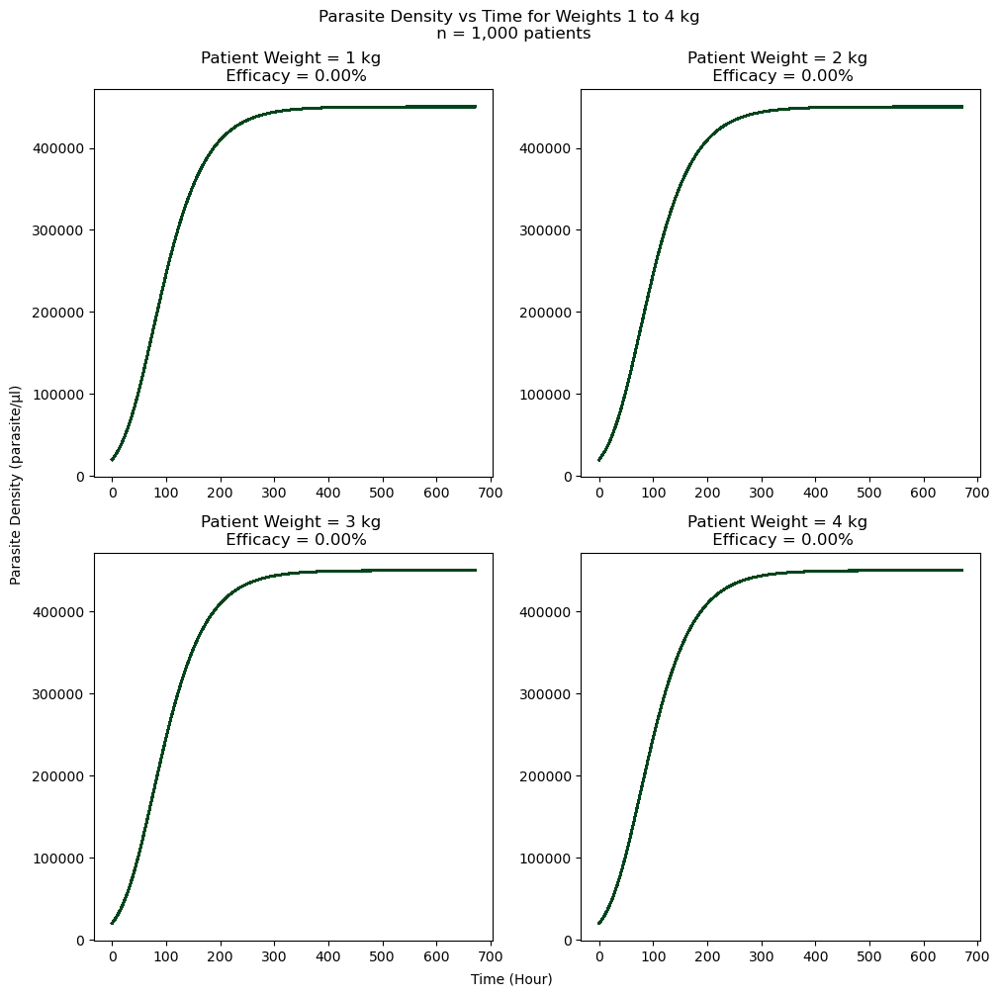

In [5]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#Define the number of unique PIDs
num_pids = len(df_weight['PID'].unique())

# Create a colormap
# Create a colormap
colormap = plt.get_cmap('BuGn')  # Ensure compatibility with different Matplotlib versions
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)  # Normalize values to 0-1 range

nrows = 2
ncols = 2

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 10))

for i, df in enumerate(dataframes_results):
    row = i // ncols
    col = i % ncols
    ax = axs[row, col]
    for j, pid in enumerate(df['PID'].unique()):
        df_pid = df[df['PID'] == pid]
        color = colormap(norm(j))
        ax.plot(df_pid['HOUR'], df_pid['PARASITEDENSITY'], color=color, alpha=0.25)
    ax.set_title(f"Patient Weight = {weight_values[i]} kg \n Efficacy = {trial_efficacy[i]:.2f}%")

#Set X and Y Labels for the entire plot
fig.text(0.5, 0, 'Time (Hour)', ha='center', va='center')
fig.text(0, 0.5, 'Parasite Density (parasite/μl)', ha='center', va='center', rotation='vertical')
fig.suptitle("Parasite Density vs Time for Weights 1 to 4 kg \n n = 1,000 patients")
plt.savefig("pkpd_AL_weight_calibration_group_01_parasitedensity_01.png")
plt.tight_layout()
plt.show()

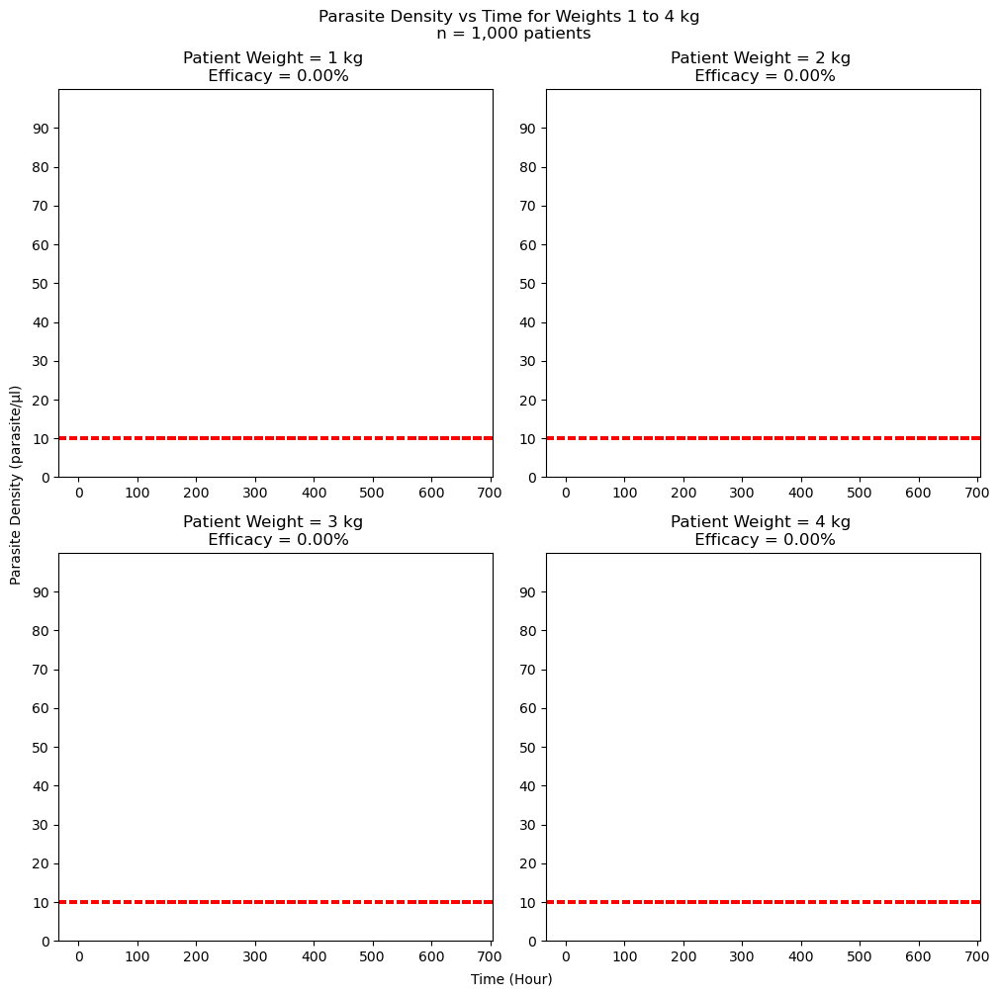

In [6]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#Define the number of unique PIDs
num_pids = len(df_weight['PID'].unique())

# Create a colormap
# Create a colormap
colormap = plt.get_cmap('BuGn')  # Ensure compatibility with different Matplotlib versions
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)  # Normalize values to 0-1 range

nrows = 2
ncols = 2

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 10))

for i, df in enumerate(dataframes_results):
    row = i // ncols
    col = i % ncols
    ax = axs[row, col]
    for j, pid in enumerate(df['PID'].unique()):
        df_pid = df[df['PID'] == pid]
        color = colormap(norm(j))
        ax.plot(df_pid['HOUR'], df_pid['PARASITEDENSITY'], color=color, alpha=0.25)
        #Adding a horizontal line at 10 parasites/μl
        ax.axhline(y=10, color='Red', linestyle='--', alpha=0.5)
    ax.set_ylim(0, 100)
    ax.set_yticks(np.arange(0, 100, 10))
    ax.set_title(f"Patient Weight = {weight_values[i]} kg \n Efficacy = {trial_efficacy[i]:.2f}%")

#Set X and Y Labels for the entire plot
fig.text(0.5, 0, 'Time (Hour)', ha='center', va='center')
fig.text(0, 0.5, 'Parasite Density (parasite/μl)', ha='center', va='center', rotation='vertical')
fig.suptitle("Parasite Density vs Time for Weights 1 to 4 kg \n n = 1,000 patients")
plt.savefig("pkpd_AL_weight_calibration_group_01_parasitedensity_02.png")
plt.tight_layout()
plt.show()

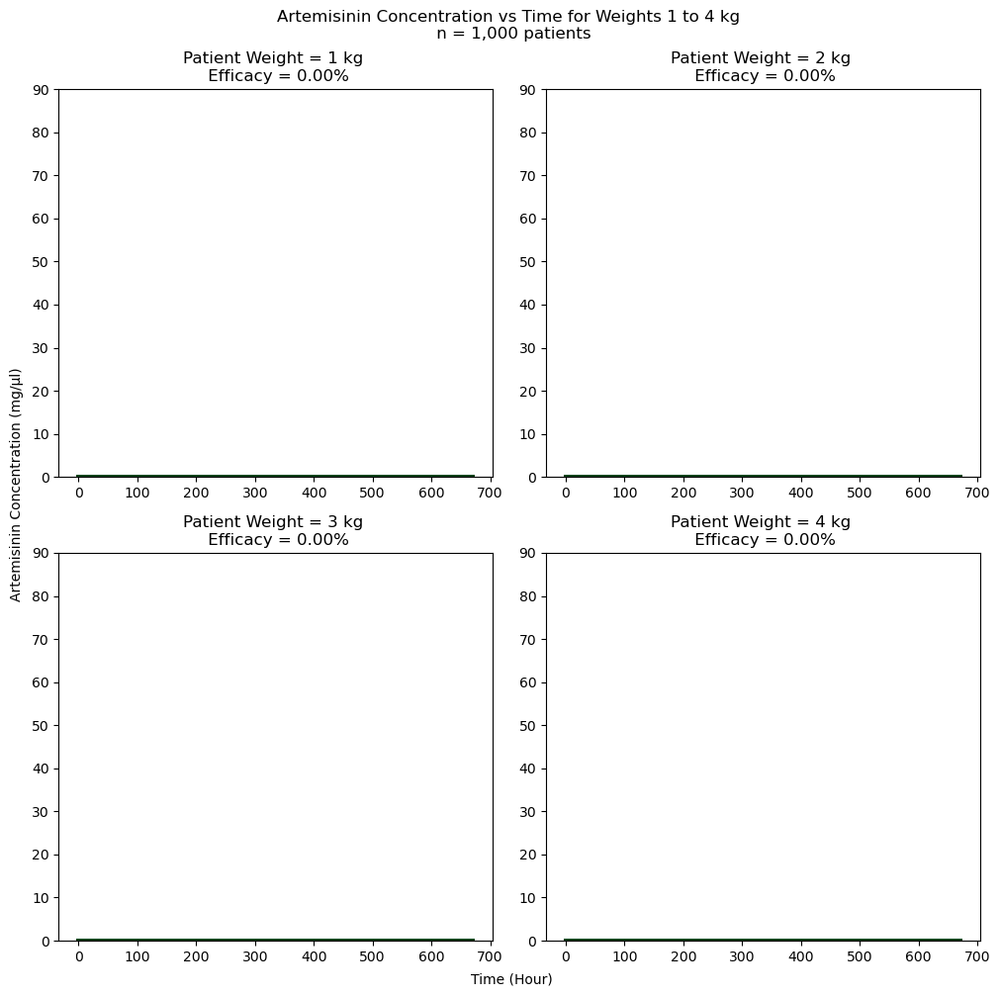

In [8]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#Define the number of unique PIDs
num_pids = len(df_weight['PID'].unique())

# Create a colormap
colormap = plt.get_cmap('BuGn')  # Ensure compatibility with different Matplotlib versions
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)  # Normalize values to 0-1 range

nrows = 2
ncols = 2

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 10))

for i, df in enumerate(dataframes_results):
    row = i // ncols
    col = i % ncols
    ax = axs[row, col]
    for j, pid in enumerate(df['PID'].unique()):
        df_pid = df[df['PID'] == pid]
        color = colormap(norm(j))
        ax.plot(df_pid['HOUR'], df_pid['COMP2CONC_ART'], color=color)
    ax.set_yticks(np.arange(0, 100, 10))
    ax.set_title(f"Patient Weight = {weight_values[i]} kg \n Efficacy = {trial_efficacy[i]:.2f}%")

#Set X and Y Labels for the entire plot
fig.text(0.5, 0, 'Time (Hour)', ha='center', va='center')
fig.text(0, 0.5, 'Artemisinin Concentration (mg/μl)', ha='center', va='center', rotation='vertical')
fig.suptitle("Artemisinin Concentration vs Time for Weights 1 to 4 kg \n n = 1,000 patients")
plt.savefig("pkpd_AL_weight_calibration_group_01_art_conc.png")
plt.tight_layout()
plt.show()

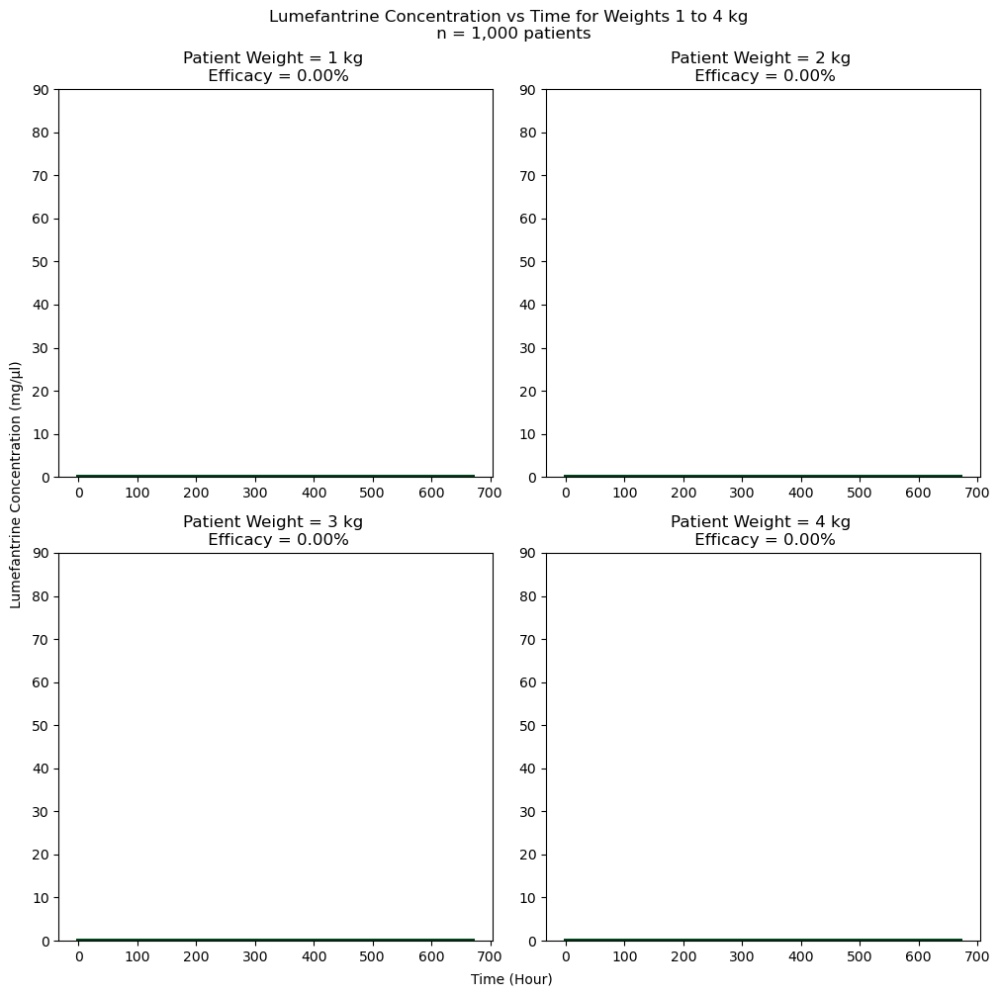

In [9]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#Define the number of unique PIDs
num_pids = len(df_weight['PID'].unique())

# Create a colormap
colormap = plt.get_cmap('BuGn')  # Ensure compatibility with different Matplotlib versions
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)  # Normalize values to 0-1 range

nrows = 2
ncols = 2

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 10))

for i, df in enumerate(dataframes_results):
    row = i // ncols
    col = i % ncols
    ax = axs[row, col]
    for j, pid in enumerate(df['PID'].unique()):
        df_pid = df[df['PID'] == pid]
        color = colormap(norm(j))
        ax.plot(df_pid['HOUR'], df_pid['COMP2CONC_LUM'], color=color)
    ax.set_yticks(np.arange(0, 100, 10))
    ax.set_title(f"Patient Weight = {weight_values[i]} kg \n Efficacy = {trial_efficacy[i]:.2f}%")

#Set X and Y Labels for the entire plot
fig.text(0.5, 0, 'Time (Hour)', ha='center', va='center')
fig.text(0, 0.5, 'Lumefantrine Concentration (mg/μl)', ha='center', va='center', rotation='vertical')
fig.suptitle("Lumefantrine Concentration vs Time for Weights 1 to 4 kg \n n = 1,000 patients")
plt.savefig("pkpd_AL_weight_calibration_group_01_lum_conc.png")
plt.tight_layout()
plt.show()

<br>

### Weight group 5-7.99 kg (0.5 tablets/ 20mg of dha, 1 tablet/ 120mg of lum)
### Weight group 8.0 - 10.99 kg (0.75 tablets/ 30mg of dha, 1 tablet/ 120mg of lum)
### Weight group 11.0 - 16.99 kg (1 tablet/ 40mg of dha, 1 or 2 tablets/ 120mg or 240mg of lum)
### Weight group 17.0 - 24.99 kg (1.5 tablets/ 60mg of dha, 1 or 2 tablets/ 120mg or 240mg of lum)

<br>

### DHA and LUM have different weight groups
#### To keep things simple, group 02 will be 5 - 23 kg

In [10]:
# Checking if we are in the correct directory
#wd()

# Define the range for weight groups
min_weight = 5
max_weight = 23

# Define values
weight_values = list(range(min_weight, max_weight, 3))

# Prepare a list of parameters to pass to the pool
params_list = [(i, weight_values[i]) for i in range(len(weight_values))]

# Initialize a grid to store the clearance rates
trial_efficacy = np.zeros(len(weight_values))

# Initialize a list to store the DataFrames
dataframes_results = []

print(weight_values)
print(len(weight_values))

#Saving weights for future reference
np.savetxt('pkpd_AL_weight_calibration_weight_range_group_02.txt', weight_values, delimiter=',', fmt='%5f')


[5, 8, 11, 14, 17, 20]
6


In [11]:
import subprocess
import pandas as pd
import numpy as np
from multiprocessing import Pool, cpu_count
from tqdm import tqdm
import matplotlib.pyplot as plt

# Function to run a single simulation for a given weight value
def run_simulation(idx, weight):
    command_weight = [
        "/home/venitha_b/Projects/2019-test-ppq-pk/build/run_ppq_pk",
        "--AL",
        "-n", "1000",
        "--weight", str(weight)
    ]

    try:
        # Run the command and capture output
        output_weight = subprocess.run(command_weight, capture_output=True, text=True, check=True)

        # Process the output
        lines_weight = output_weight.stdout.splitlines()
        df_weight = pd.DataFrame([line.split(',') for line in lines_weight], columns=["PID", "HOUR", "COMP2CONC_ART", "COMP2CONC_LUM", "PARASITEDENSITY"])
        
        # Clean the DataFrame
        df_weight = df_weight.iloc[1:].apply(pd.to_numeric, errors='coerce')

        # Save the DataFrame to a CSV file
        df_weight.to_csv(f"df_weight_group_02_run_{idx+1}.csv", index=False)

        # Calculate the efficacy
        if df_weight['PARASITEDENSITY'].isna().any():
            failed_treatment_count = np.nan
        else:
            failed_treatment_count = df_weight[(df_weight['PARASITEDENSITY'] >= 10) & (df_weight['HOUR'] == 671.0)].shape[0]
        
        total_patients = df_weight['PID'].nunique()
        
        if total_patients == 0 or np.isnan(failed_treatment_count): 
            efficacy = np.nan
        else:
            efficacy = (100 - ((failed_treatment_count / total_patients) * 100))
            if np.isnan(efficacy):
                efficacy = np.nan
        return (idx, efficacy, df_weight, failed_treatment_count)

    except subprocess.CalledProcessError as e:
        print(f"Error in subprocess for weight: {weight}: {e}")
        return (idx, np.nan, None, 0)  # Return NaN, None, and 0 in case of failure
    except Exception as e:
        print(f"An unexpected error occurred for weight: {weight}: {e}")
        return (idx, np.nan, None, 0)  # Return NaN, None, and 0 in case of failure

# Define number of workers (use all available CPU cores)
num_workers = cpu_count()

# Prepare a list of parameters to pass to the pool
params_list = [(i, weight_values[i]) for i in range(len(weight_values))]

# Initialize an array to store the efficacies
trial_efficacy = np.zeros(len(weight_values))

# Initialize a list to store the DataFrames
dataframes_results = []
failed_patients = np.zeros(len(weight_values))

# Run simulations in parallel and track progress
with Pool(processes=num_workers) as pool:
    results = []
    with tqdm(total=len(params_list), desc="Running simulations") as pbar:
        for result in pool.starmap(run_simulation, params_list):
            results.append(result)
            pbar.update(1)  # Update progress bar after each result

# Update the trial_efficacy array with the results and store DataFrames
for idx, efficacy, df_weight, failed_treatment_count in results:
    trial_efficacy[idx] = efficacy
    failed_patients[idx] = failed_treatment_count
    dataframes_results.append(df_weight)

# Create a DataFrame with weight values and efficacies
df_efficacy = pd.DataFrame({
    'weight': weight_values,
    'efficacy': trial_efficacy
})

# Save the DataFrame to a pickle file
df_efficacy.to_pickle("pkpd_AL_weight_calibration_group_02.pyobj")

# Save the DataFrame to a CSV file
df_efficacy.to_csv("pkpd_AL_weight_calibration_group_02.csv", index=False)

#Saving failed patient count for future reference
np.savetxt('pkpd_AL_weight_calibration_group_02_patient_failure.txt', failed_patients, delimiter=',', fmt='%2f')

print("DataFrame saved as pickle and CSV files successfully.")

Running simulations: 100%|██████████| 6/6 [00:40<00:00,  6.72s/it]

DataFrame saved as pickle and CSV files successfully.


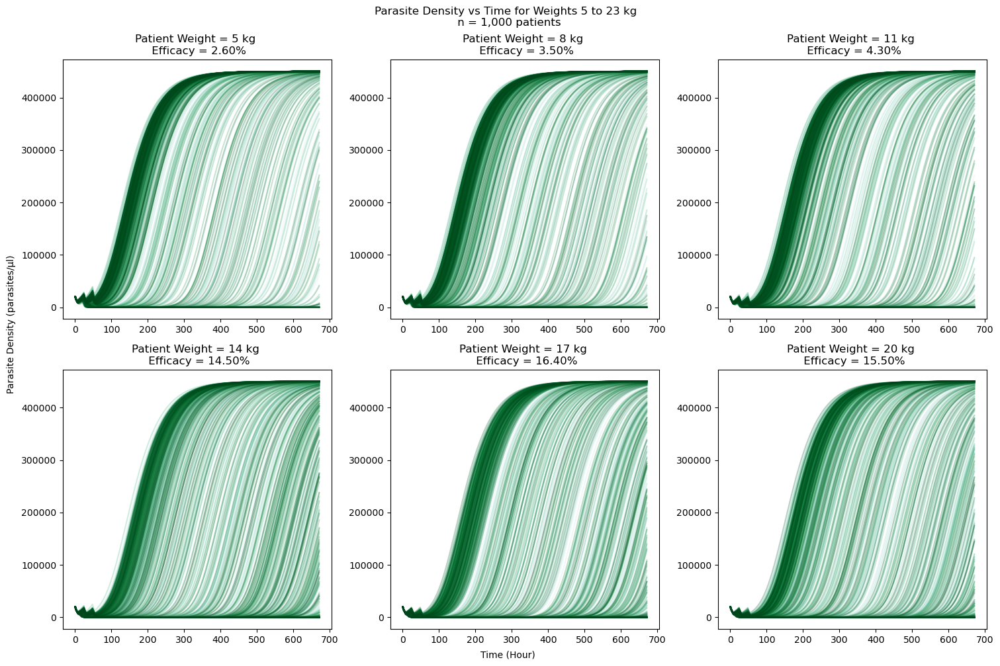

In [12]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#Define the number of unique PIDs
num_pids = len(df_weight['PID'].unique())

# Create a colormap
colormap = plt.get_cmap('BuGn')  # Ensure compatibility with different Matplotlib versions
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)  # Normalize values to 0-1 range

nrows = 2
ncols = 3

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 10))

for i, df in enumerate(dataframes_results):
    row = i // ncols
    col = i % ncols
    ax = axs[row, col]
    for j, pid in enumerate(df['PID'].unique()):
        df_pid = df[df['PID'] == pid]
        color = colormap(norm(j))
        ax.plot(df_pid['HOUR'], df_pid['PARASITEDENSITY'], color=color, alpha = 0.25)
    ax.set_title(f"Patient Weight = {weight_values[i]} kg \n Efficacy = {trial_efficacy[i]:.2f}%")

#Set X and Y Labels for the entire plot
fig.text(0.5, 0, 'Time (Hour)', ha='center', va='center')
fig.text(0, 0.5, 'Parasite Density (parasites/μl)', ha='center', va='center', rotation='vertical')
fig.suptitle("Parasite Density vs Time for Weights 5 to 23 kg \n n = 1,000 patients")
plt.savefig("pkpd_AL_weight_calibration_group_02_parasitedensity_01.png")
plt.tight_layout()
plt.show()

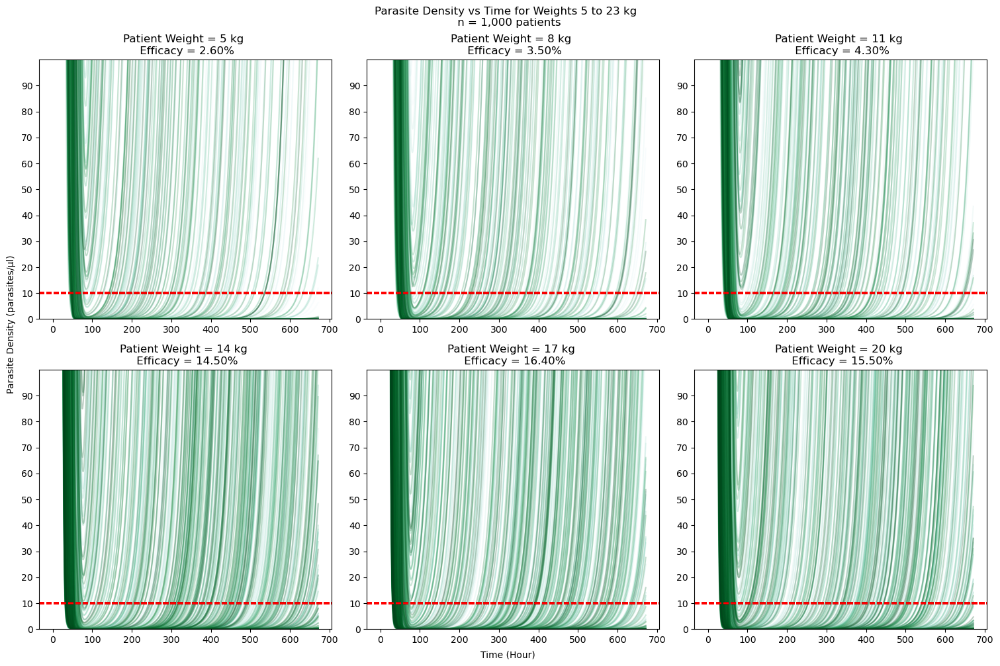

In [13]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#Define the number of unique PIDs
num_pids = len(df_weight['PID'].unique())

# Create a colormap
colormap = plt.get_cmap('BuGn')  # Ensure compatibility with different Matplotlib versions
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)  # Normalize values to 0-1 range

nrows = 2
ncols = 3

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 10))

for i, df in enumerate(dataframes_results):
    row = i // ncols
    col = i % ncols
    ax = axs[row, col]
    for j, pid in enumerate(df['PID'].unique()):
        df_pid = df[df['PID'] == pid]
        color = colormap(norm(j))
        ax.plot(df_pid['HOUR'], df_pid['PARASITEDENSITY'], color=color, alpha = 0.25)
        #Adding a horizontal line at 10 parasites/μl
        ax.axhline(y=10, color='Red', linestyle='--', alpha=0.5)
    ax.set_ylim(0, 100)
    ax.set_yticks(np.arange(0, 100, 10))
    ax.set_title(f"Patient Weight = {weight_values[i]} kg \n Efficacy = {trial_efficacy[i]:.2f}%")

#Set X and Y Labels for the entire plot
fig.text(0.5, 0, 'Time (Hour)', ha='center', va='center')
fig.text(0, 0.5, 'Parasite Density (parasites/μl)', ha='center', va='center', rotation='vertical')
fig.suptitle("Parasite Density vs Time for Weights 5 to 23 kg \n n = 1,000 patients")
plt.savefig("pkpd_AL_weight_calibration_group_02_parasitedensity_02.png")
plt.tight_layout()
plt.show()

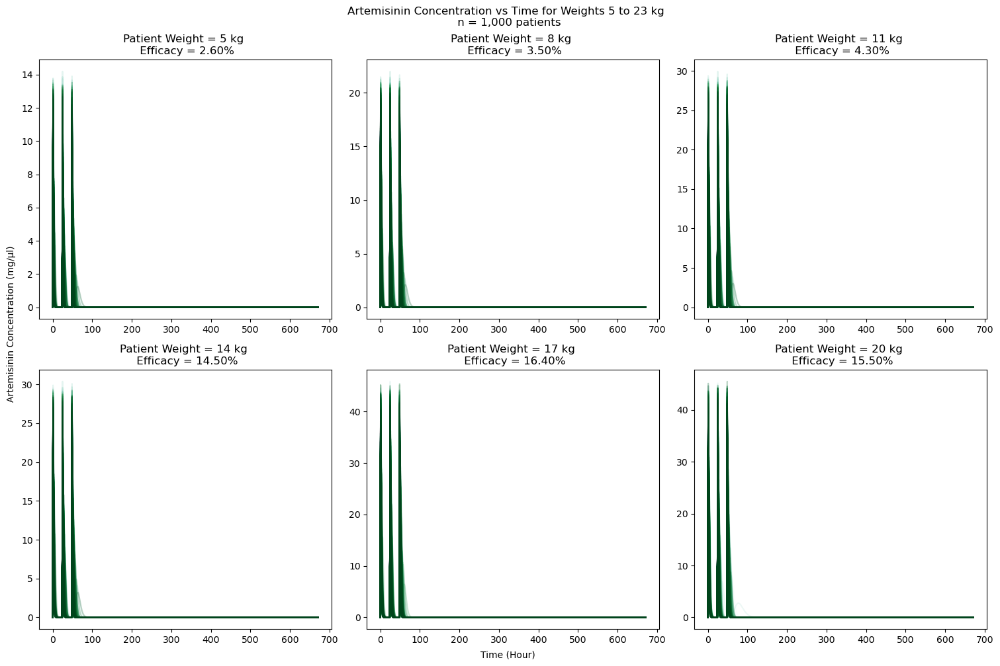

In [14]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#Define the number of unique PIDs
num_pids = len(df_weight['PID'].unique())

# Create a colormap
colormap = plt.get_cmap('BuGn')  # Ensure compatibility with different Matplotlib versions
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)  # Normalize values to 0-1 range

nrows = 2
ncols = 3

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 10))

for i, df in enumerate(dataframes_results):
    row = i // ncols
    col = i % ncols
    ax = axs[row, col]
    for j, pid in enumerate(df['PID'].unique()):
        df_pid = df[df['PID'] == pid]
        color = colormap(norm(j))
        ax.plot(df_pid['HOUR'], df_pid['COMP2CONC_ART'], color=color, alpha = 0.25)
    ax.set_title(f"Patient Weight = {weight_values[i]} kg \n Efficacy = {trial_efficacy[i]:.2f}%")


#Set X and Y Labels for the entire plot
fig.text(0.5, 0, 'Time (Hour)', ha='center', va='center')
fig.text(0, 0.5, 'Artemisinin Concentration (mg/μl)', ha='center', va='center', rotation='vertical')
fig.suptitle("Artemisinin Concentration vs Time for Weights 5 to 23 kg \n n = 1,000 patients")
plt.savefig("pkpd_AL_weight_calibration_group_02_art_conc.png")
plt.tight_layout()
plt.show()

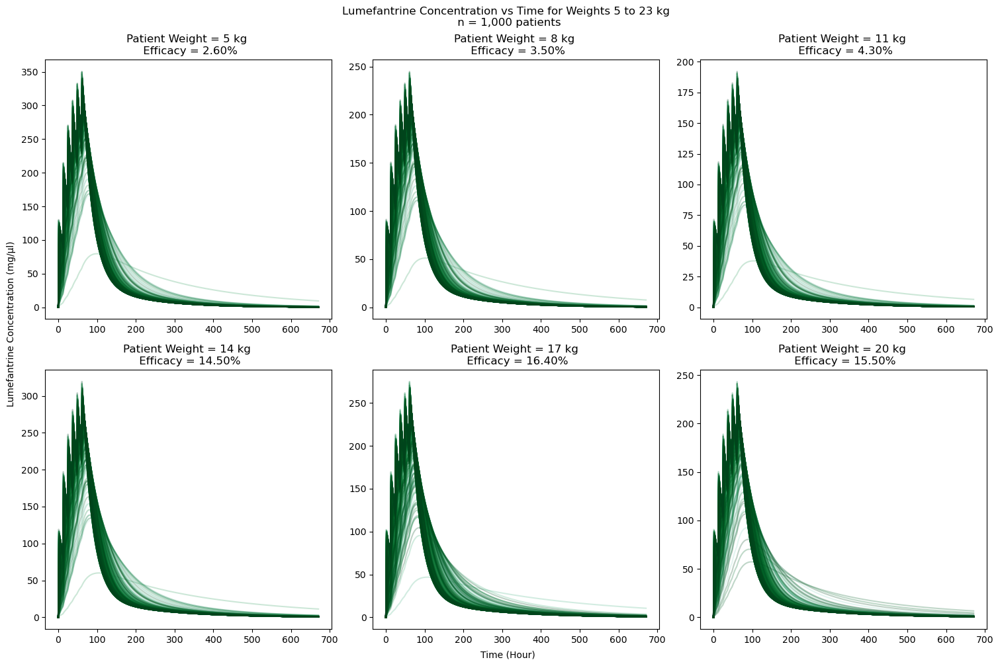

In [15]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#Define the number of unique PIDs
num_pids = len(df_weight['PID'].unique())

# Create a colormap
colormap = plt.get_cmap('BuGn')  # Ensure compatibility with different Matplotlib versions
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)  # Normalize values to 0-1 range

nrows = 2
ncols = 3

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 10))

for i, df in enumerate(dataframes_results):
    row = i // ncols
    col = i % ncols
    ax = axs[row, col]
    for j, pid in enumerate(df['PID'].unique()):
        df_pid = df[df['PID'] == pid]
        color = colormap(norm(j))
        #Convert COMP2CONC_LUM to mg/μl from μg/μl
        df_pid = df[df['PID'] == pid].copy()  # Avoid SettingWithCopyWarning
        df_pid['COMP2CONC_LUM'] /= 100  # Modify safely
        color = colormap(norm(j))
        ax.plot(df_pid['HOUR'], df_pid['COMP2CONC_LUM'], color=color, alpha=0.25)
    ax.set_title(f"Patient Weight = {weight_values[i]} kg \n Efficacy = {trial_efficacy[i]:.2f}%")

#Set X and Y Labels for the entire plot
fig.text(0.5, 0, 'Time (Hour)', ha='center', va='center')
fig.text(0, 0.5, 'Lumefantrine Concentration (mg/μl)', ha='center', va='center', rotation='vertical')
fig.suptitle("Lumefantrine Concentration vs Time for Weights 5 to 23 kg \n n = 1,000 patients")
plt.savefig("pkpd_AL_weight_calibration_group_02_lum_conc.png")
plt.tight_layout()
plt.show()

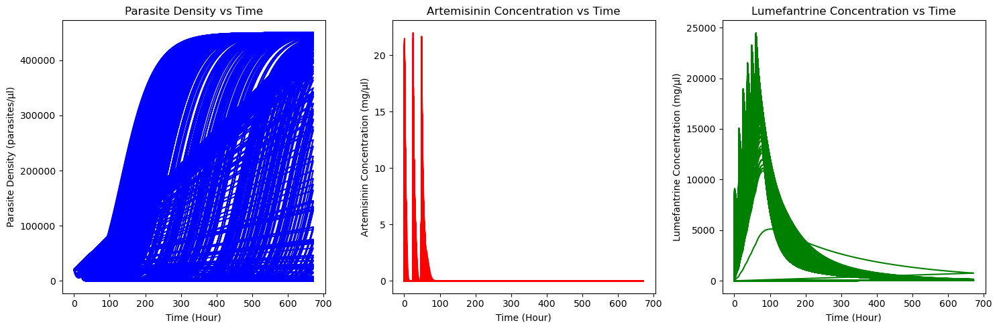

In [17]:
#Plot parasite density, artemisinin and lumefantrine concentration for weight group 2, run 2, patient weight = 8kg

import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(df_weight_group_02_run_2['HOUR'], df_weight_group_02_run_2['PARASITEDENSITY'], color='blue')
plt.xlabel('Time (Hour)')
plt.ylabel('Parasite Density (parasites/μl)')
plt.title('Parasite Density vs Time')

plt.subplot(1, 3, 2)
plt.plot(df_weight_group_02_run_2['HOUR'], df_weight_group_02_run_2['COMP2CONC_ART'], color='red')
plt.xlabel('Time (Hour)')
plt.ylabel('Artemisinin Concentration (mg/μl)')
plt.title('Artemisinin Concentration vs Time')

plt.subplot(1, 3, 3)
plt.plot(df_weight_group_02_run_2['HOUR'], df_weight_group_02_run_2['COMP2CONC_LUM'], color='green')
plt.xlabel('Time (Hour)')
plt.ylabel('Lumefantrine Concentration (mg/μl)')
plt.title('Lumefantrine Concentration vs Time')

plt.tight_layout()
plt.show()


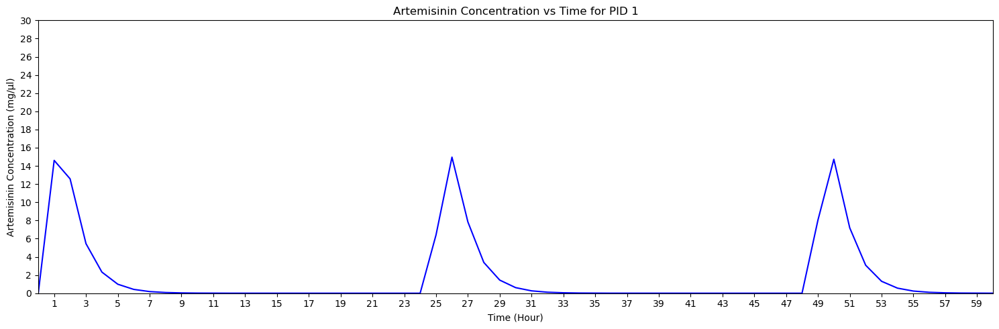

In [18]:
#Plotting artemisinin concentration vs time at hours 0, 24 and 48

import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))


#Plotting only for PID 1

plt.plot(df_weight_group_02_run_2[df_weight_group_02_run_2['PID'] == 1.0]['HOUR'], df_weight_group_02_run_2[df_weight_group_02_run_2['PID'] == 1.0]['COMP2CONC_ART'], color='blue')
#plt.plot(df_weight_group_02_run_2[df_weight_group_02_run_2['HOUR'] == 1.0]['COMP2CONC_ART'] , color='red', label='Hour 0')

#Setting x-axis limits
plt.xlim(0, 60)
plt.xticks(np.arange(1, 60, 2))

#Setting y-axis limits
plt.ylim(0, 30)
plt.yticks(np.arange(0, 32, 2))

#Setting the x-axis to show only hours 0, 24 and 48
#plt.xticks([0, 24, 48])

plt.xlabel('Time (Hour)')
plt.ylabel('Artemisinin Concentration (mg/μl)')
plt.title('Artemisinin Concentration vs Time for PID 1')

plt.tight_layout()
plt.show()


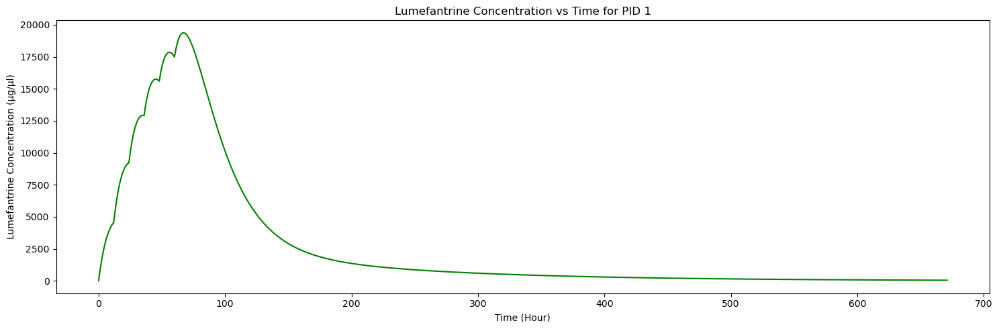

In [19]:
#Plotting lumefantrine concentration vs time at hours 0, 24 and 48

import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))


#Plotting only for PID 1

plt.plot(df_weight_group_02_run_2[df_weight_group_02_run_2['PID'] == 1.0]['HOUR'], df_weight_group_02_run_2[df_weight_group_02_run_2['PID'] == 1.0]['COMP2CONC_LUM'], color='green')
#plt.plot(df_weight_group_02_run_2[df_weight_group_02_run_2['HOUR'] == 1.0]['COMP2CONC_LUM'] , color='red', label='Hour 0')

#Setting x-axis limits
#plt.xlim(0, 60)
#plt.xticks(np.arange(1, 60, 2))

#Setting y-axis limits
#plt.ylim(0, 130)
#plt.yticks(np.arange(0, 132, 6))

#Setting the x-axis to show only hours 0, 24 and 48
#plt.xticks([0, 24, 48])

plt.xlabel('Time (Hour)')
plt.ylabel('Lumefantrine Concentration (μg/μl)')
plt.title('Lumefantrine Concentration vs Time for PID 1')

plt.tight_layout()
plt.show()


In [20]:
#First convert COMP2CONC_LUM from μg/μl to mg/μl
df_weight_group_02_run_2_copy = df_weight_group_02_run_2
df_weight_group_02_run_2_copy['COMP2CONC_LUM'] /= 100

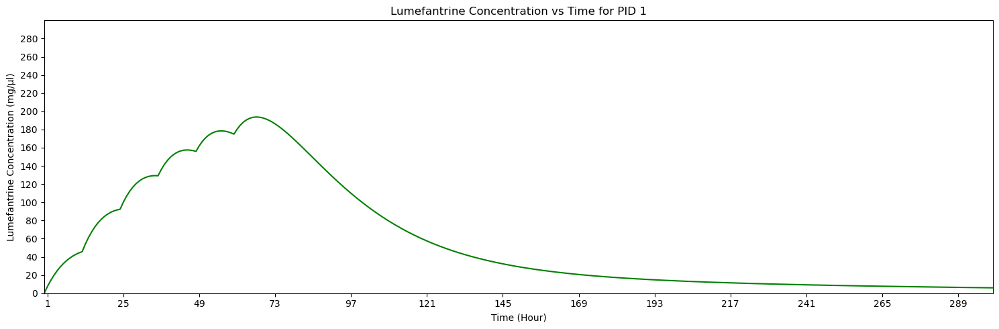

In [21]:
#Plotting lumefantrine concentration vs time at hours 0, 24 and 48

import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))


#Plotting only for PID 1
plt.plot(df_weight_group_02_run_2_copy[df_weight_group_02_run_2_copy['PID'] == 1.0]['HOUR'], df_weight_group_02_run_2_copy[df_weight_group_02_run_2_copy['PID'] == 1.0]['COMP2CONC_LUM'], color='green')
#plt.plot(df_weight_group_02_run_2[df_weight_group_02_run_2['HOUR'] == 1.0]['COMP2CONC_LUM'] , color='red', label='Hour 0')

#Setting x-axis limits
plt.xlim(0, 300)
plt.xticks(np.arange(1, 300, 24))

#Setting y-axis limits
plt.ylim(0, 300)
plt.yticks(np.arange(0, 300, 20))

#Setting the x-axis to show only hours 0, 24 and 48
#plt.xticks([0, 24, 48])

plt.xlabel('Time (Hour)')
plt.ylabel('Lumefantrine Concentration (mg/μl)')
plt.title('Lumefantrine Concentration vs Time for PID 1')

plt.tight_layout()
plt.show()


In [69]:
df_weight_group_02_run_2_copy[df_weight_group_02_run_2_copy['PID'] == 1.0]['COMP2CONC_LUM']

672     0.000000e+00
673     1.906332e-15
674     3.350279e-15
675     4.429910e-15
676     5.222945e-15
            ...     
1339    4.036000e-17
1340    4.008000e-17
1341    3.980100e-17
1342    3.952400e-17
1343    3.925000e-17
Name: COMP2CONC_LUM, Length: 672, dtype: float64

In [30]:
#Loading dataframes to check individual runs for dose statistics

df_weight_group_02_run_1 = pd.read_csv('df_weight_group_02_run_1.csv') #Weight = 5kg
df_weight_group_02_run_2 = pd.read_csv('df_weight_group_02_run_2.csv') #Weight = 8kg
df_weight_group_02_run_3 = pd.read_csv('df_weight_group_02_run_3.csv') #Weight = 11kg
df_weight_group_02_run_4 = pd.read_csv('df_weight_group_02_run_4.csv') #Weight = 14kg
df_weight_group_02_run_5 = pd.read_csv('df_weight_group_02_run_5.csv') #Weight = 17kg
df_weight_group_02_run_6 = pd.read_csv('df_weight_group_02_run_6.csv') #Weight = 20kg

In [25]:
#Getting the value of COMP2CONC_ART at hour 0 for each patient by patient ID

df_weight_group_02_run_1_hour_0 = df_weight_group_02_run_1.groupby('PID').apply(lambda x: x[x['HOUR'] == 1]['COMP2CONC_ART'])
df_weight_group_02_run_1_hour_0.describe()

/tmp/ipykernel_5088/110949206.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_weight_group_02_run_1_hour_0 = df_weight_group_02_run_1.groupby('PID').apply(lambda x: x[x['HOUR'] == 1]['COMP2CONC_ART'])


count    1000.000000
mean        7.807743
std         4.089160
min         0.006000
25%         4.114500
50%         9.026500
75%        11.478500
max        13.776000
Name: COMP2CONC_ART, dtype: float64

In [23]:
#Getting the value of COMP2CONC_ART at hour 24 for each patient by patient ID

df_weight_group_02_run_1_hour_24 = df_weight_group_02_run_1.groupby('PID').apply(lambda x: x[x['HOUR'] == 25.0]['COMP2CONC_ART'])
df_weight_group_02_run_1_hour_24.describe()

/tmp/ipykernel_5088/1418246682.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_weight_group_02_run_1_hour_24 = df_weight_group_02_run_1.groupby('PID').apply(lambda x: x[x['HOUR'] == 25.0]['COMP2CONC_ART'])


count    1000.000000
mean        7.337672
std         4.568323
min         0.000000
25%         2.608250
50%         9.079000
75%        11.415000
max        14.191000
Name: COMP2CONC_ART, dtype: float64

In [29]:
#Getting the value of COMP2CONC_ART at hour 48 for each patient by patient ID

df_weight_group_02_run_1_hour_48 = df_weight_group_02_run_1.groupby('PID').apply(lambda x: x[x['HOUR'] == 49.0]['COMP2CONC_ART'])
df_weight_group_02_run_1_hour_48.describe()

/tmp/ipykernel_5088/607091034.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_weight_group_02_run_1_hour_48 = df_weight_group_02_run_1.groupby('PID').apply(lambda x: x[x['HOUR'] == 49.0]['COMP2CONC_ART'])


count    1000.000000
mean        6.785402
std         4.647433
min         0.000000
25%         1.696500
50%         8.279500
75%        10.973500
max        13.903000
Name: COMP2CONC_ART, dtype: float64

In [14]:
#Grouping patients by ID and checking dose statistics for each patient

df_weight_group_02_run_1_grouped = df_weight_group_02_run_1.groupby('PID').agg({'COMP2CONC_ART': ['mean', 'std', 'min', 'max'], 'COMP2CONC_LUM': ['mean', 'std', 'min', 'max'], 'PARASITEDENSITY': ['mean', 'std', 'min', 'max']})
df_weight_group_02_run_1_grouped

COMP2CONC_ART                        COMP2CONC_LUM                    \
             mean       std  min     max          mean          std  min   
PID                                                                        
0        0.081765  0.560559  0.0   6.492   3904.294141  6610.725660  0.0   
1        0.094687  0.781275  0.0   9.488   3906.602263  7158.125834  0.0   
2        0.094219  0.737504  0.0   8.445   3905.706985  6907.568152  0.0   
3        0.056939  0.638702  0.0   9.711   3906.924311  7361.689238  0.0   
4        0.086284  0.765211  0.0   9.915   3906.913076  7373.038804  0.0   
..            ...       ...  ...     ...           ...          ...  ...   
995      0.064967  0.625684  0.0  10.926   3905.539396  6867.986764  0.0   
996      0.081731  0.588010  0.0   7.983   3905.888903  7498.952084  0.0   
997      0.082464  0.594717  0.0   8.688   3904.744411  7533.634347  0.0   
998      0.082190  0.668369  0.0   8.318   3904.127726  6580.203733  0.0   
999      0.081187  0.785784  0.0  11.780   3871.241152  7569.276282  0.0   

               PARASITEDENSITY                                        
           max            mean            std        min         max  
PID                                                                   
0    25102.579      667.692499    2648.672270      0.000   20000.000  
1    28083.333   157589.571746  184765.472213      0.223  446752.677  
2    26700.937    28744.012671   68969.916937      0.000  306169.843  
3    29363.394   334822.143321  161890.867293  11874.385  450076.483  
4    29446.777   330982.343557  164903.587650  10128.083  450074.103  
..         ...             ...            ...        ...         ...  
995  26484.030    27537.068417   66376.428277      0.000  299347.293  
996  30837.834   324541.350153  169109.450141   5689.104  450069.169  
997  31551.740   323658.339295  169551.060961   5583.766  450068.346  
998  24942.119      771.813095    2758.668416      0.000   20000.000  
999  35054.192   339780.512862  159271.901058  10132.265  450079.885  

[1000 rows x 12 columns]

In [16]:
df_weight_group_02_run_1_grouped['COMP2CONC_ART']['max'].describe()

count    1000.000000
mean       10.603499
std         1.922411
min         3.729000
25%         9.012750
50%        11.190500
75%        12.148750
max        14.191000
Name: max, dtype: float64

In [18]:
df_weight_group_02_run_1_grouped['COMP2CONC_LUM']['max'].describe()

count     1000.000000
mean     29997.178194
std       2794.750410
min       7965.756000
25%      28958.074750
50%      30307.691500
75%      31732.253250
max      35054.192000
Name: max, dtype: float64

In [19]:
35054.192000/100

350.54192

In [20]:
df_weight_group_02_run_2_grouped = df_weight_group_02_run_2.groupby('PID').agg({'COMP2CONC_ART': ['mean', 'std', 'min', 'max'], 'COMP2CONC_LUM': ['mean', 'std', 'min', 'max'], 'PARASITEDENSITY': ['mean', 'std', 'min', 'max']})
print("Max art: ",df_weight_group_02_run_2_grouped['COMP2CONC_ART']['max'].describe())
print("Max lum: ",df_weight_group_02_run_2_grouped['COMP2CONC_LUM']['max'].describe())


Max art:  count    1000.000000
mean       16.712786
std         2.887310
min         6.226000
25%        14.379750
50%        17.593500
75%        19.052250
max        22.000000
Name: max, dtype: float64
Max lum:  count     1000.000000
mean     20756.965011
std       2055.491779
min       5111.086000
25%      20044.506500
50%      21021.829000
75%      22028.585500
max      24492.934000
Name: max, dtype: float64


In [31]:
df_weight_group_02_run_3_grouped = df_weight_group_02_run_3.groupby('PID').agg({'COMP2CONC_ART': ['mean', 'std', 'min', 'max'], 'COMP2CONC_LUM': ['mean', 'std', 'min', 'max'], 'PARASITEDENSITY': ['mean', 'std', 'min', 'max']})
print("Max art: ",df_weight_group_02_run_3_grouped['COMP2CONC_ART']['max'].describe())
print("Max lum: ",df_weight_group_02_run_3_grouped['COMP2CONC_LUM']['max'].describe())


Max art:  count    1000.000000
mean       23.000862
std         3.836139
min         8.901000
25%        19.918250
50%        24.145500
75%        26.104500
max        29.936000
Name: max, dtype: float64
Max lum:  count     1000.000000
mean     16171.858642
std       1671.042562
min       3780.109000
25%      15616.561250
50%      16408.092000
75%      17198.483750
max      19207.284000
Name: max, dtype: float64


In [32]:
df_weight_group_02_run_4_grouped = df_weight_group_02_run_4.groupby('PID').agg({'COMP2CONC_ART': ['mean', 'std', 'min', 'max'], 'COMP2CONC_LUM': ['mean', 'std', 'min', 'max'], 'PARASITEDENSITY': ['mean', 'std', 'min', 'max']})
print("Max art: ",df_weight_group_02_run_4_grouped['COMP2CONC_ART']['max'].describe())
print("Max lum: ",df_weight_group_02_run_4_grouped['COMP2CONC_LUM']['max'].describe())


Max art:  count    1000.000000
mean       23.538270
std         3.817155
min         9.369000
25%        20.446000
50%        24.697000
75%        26.661250
max        30.371000
Name: max, dtype: float64
Max lum:  count     1000.000000
mean     26771.399219
std       2859.268614
min       6013.148000
25%      25854.035750
50%      27203.028500
75%      28515.703000
max      31950.558000
Name: max, dtype: float64


In [33]:
df_weight_group_02_run_5_grouped = df_weight_group_02_run_5.groupby('PID').agg({'COMP2CONC_ART': ['mean', 'std', 'min', 'max'], 'COMP2CONC_LUM': ['mean', 'std', 'min', 'max'], 'PARASITEDENSITY': ['mean', 'std', 'min', 'max']})
print("Max art: ",df_weight_group_02_run_5_grouped['COMP2CONC_ART']['max'].describe())
print("Max lum: ",df_weight_group_02_run_5_grouped['COMP2CONC_LUM']['max'].describe())


Max art:  count    1000.000000
mean       35.947711
std         5.526039
min        15.672000
25%        31.064000
50%        37.499000
75%        40.681000
max        45.880000
Name: max, dtype: float64
Max lum:  count     1000.000000
mean     22927.483187
std       2834.751960
min       4687.921000
25%      22254.434500
50%      23514.863000
75%      24628.839750
max      27508.107000
Name: max, dtype: float64


In [34]:
df_weight_group_02_run_6_grouped = df_weight_group_02_run_6.groupby('PID').agg({'COMP2CONC_ART': ['mean', 'std', 'min', 'max'], 'COMP2CONC_LUM': ['mean', 'std', 'min', 'max'], 'PARASITEDENSITY': ['mean', 'std', 'min', 'max']})
print("Max art: ",df_weight_group_02_run_6_grouped['COMP2CONC_ART']['max'].describe())
print("Max lum: ",df_weight_group_02_run_6_grouped['COMP2CONC_LUM']['max'].describe())


Max art:  count    1000.000000
mean       36.112446
std         5.752388
min        18.483000
25%        31.503000
50%        37.700000
75%        40.954500
max        45.475000
Name: max, dtype: float64
Max lum:  count     1000.000000
mean     20442.573933
std       2195.025177
min       5732.912000
25%      19714.245000
50%      20840.470500
75%      21683.244250
max      24350.237000
Name: max, dtype: float64


<br>

### Weight group 25 - 35.99 kg (2 tablets/ 80mg of dha, 3 or 4 tablets/ 360mg or 480mg of lum)
### Weight group 36 - 59.99 kg (3 tablets/ 120mg of dha, 4 tablets/ 480mg of lum)
### Weight group 60 - 79.99 kg (4 tablet/ 160mg of dha, 4 tablets/ 480mg of lum)
### Weight group >= 80 kg (5 tablets/ 200mg of dha, 4 tablets/ 480mg of lum)

In [22]:
# Checking if we are in the correct directory
#wd()

# Define the range for weight groups
min_weight = 25
max_weight = 95

# Define values
weight_values = list(range(min_weight, max_weight+1, 5))

# Prepare a list of parameters to pass to the pool
params_list = [(i, weight_values[i]) for i in range(len(weight_values))]

# Initialize a grid to store the clearance rates
trial_efficacy = np.zeros(len(weight_values))

# Initialize a list to store the DataFrames
dataframes_results = []

print(weight_values)
print(len(weight_values))

#Saving weights for future reference
np.savetxt('pkpd_AL_weight_calibration_weight_range_group_03.txt', weight_values, delimiter=',', fmt='%5f')


[25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95]
15


In [23]:
import subprocess
import pandas as pd
import numpy as np
from multiprocessing import Pool, cpu_count
from tqdm import tqdm
import matplotlib.pyplot as plt

# Function to run a single simulation for a given weight value
def run_simulation(idx, weight):
    command_weight = [
        "/home/venitha_b/Projects/2019-test-ppq-pk/build/run_ppq_pk",
        "--AL",
        "-n", "1000",
        "--weight", str(weight)
    ]

    try:
        # Run the command and capture output
        output_weight = subprocess.run(command_weight, capture_output=True, text=True, check=True)

        # Process the output
        lines_weight = output_weight.stdout.splitlines()
        df_weight = pd.DataFrame([line.split(',') for line in lines_weight], columns=["PID", "HOUR", "COMP2CONC_ART", "COMP2CONC_LUM", "PARASITEDENSITY"])
        
        # Clean the DataFrame
        df_weight = df_weight.iloc[1:].apply(pd.to_numeric, errors='coerce')

        # Save the DataFrame to a CSV file
        df_weight.to_csv(f"df_weight_group_03_run_{idx+1}.csv", index=False)

        # Calculate the efficacy
        if df_weight['PARASITEDENSITY'].isna().any():
            failed_treatment_count = np.nan
        else:
            failed_treatment_count = df_weight[(df_weight['PARASITEDENSITY'] >= 10) & (df_weight['HOUR'] == 671.0)].shape[0]
        
        total_patients = df_weight['PID'].nunique()
        
        if total_patients == 0 or np.isnan(failed_treatment_count): 
            efficacy = np.nan
        else:
            efficacy = (100 - ((failed_treatment_count / total_patients) * 100))
            if np.isnan(efficacy):
                efficacy = np.nan
        return (idx, efficacy, df_weight, failed_treatment_count)

    except subprocess.CalledProcessError as e:
        print(f"Error in subprocess for weight: {weight}: {e}")
        return (idx, np.nan, None, 0)  # Return NaN, None, and 0 in case of failure
    except Exception as e:
        print(f"An unexpected error occurred for weight: {weight}: {e}")
        return (idx, np.nan, None, 0)  # Return NaN, None, and 0 in case of failure

# Define number of workers (use all available CPU cores)
num_workers = cpu_count()

# Prepare a list of parameters to pass to the pool
params_list = [(i, weight_values[i]) for i in range(len(weight_values))]

# Initialize an array to store the efficacies
trial_efficacy = np.zeros(len(weight_values))

# Initialize a list to store the DataFrames
dataframes_results = []
failed_patients = np.zeros(len(weight_values))

# Run simulations in parallel and track progress
with Pool(processes=num_workers) as pool:
    results = []
    with tqdm(total=len(params_list), desc="Running simulations") as pbar:
        for result in pool.starmap(run_simulation, params_list):
            results.append(result)
            pbar.update(1)  # Update progress bar after each result

# Update the trial_efficacy array with the results and store DataFrames
for idx, efficacy, df_weight, failed_treatment_count in results:
    trial_efficacy[idx] = efficacy
    failed_patients[idx] = failed_treatment_count
    dataframes_results.append(df_weight)

# Create a DataFrame with weight values and efficacies
df_efficacy = pd.DataFrame({
    'weight': weight_values,
    'efficacy': trial_efficacy
})

# Save the DataFrame to a pickle file
df_efficacy.to_pickle("pkpd_AL_weight_calibration_group_03.pyobj")

# Save the DataFrame to a CSV file
df_efficacy.to_csv("pkpd_AL_weight_calibration_group_03.csv", index=False)

#Saving failed patient count for future reference
np.savetxt('pkpd_AL_weight_calibration_group_03_patient_failure.txt', failed_patients, delimiter=',', fmt='%2f')

print("DataFrame saved as pickle and CSV files successfully.")

Running simulations: 100%|██████████| 15/15 [01:26<00:00,  5.78s/it]

DataFrame saved as pickle and CSV files successfully.


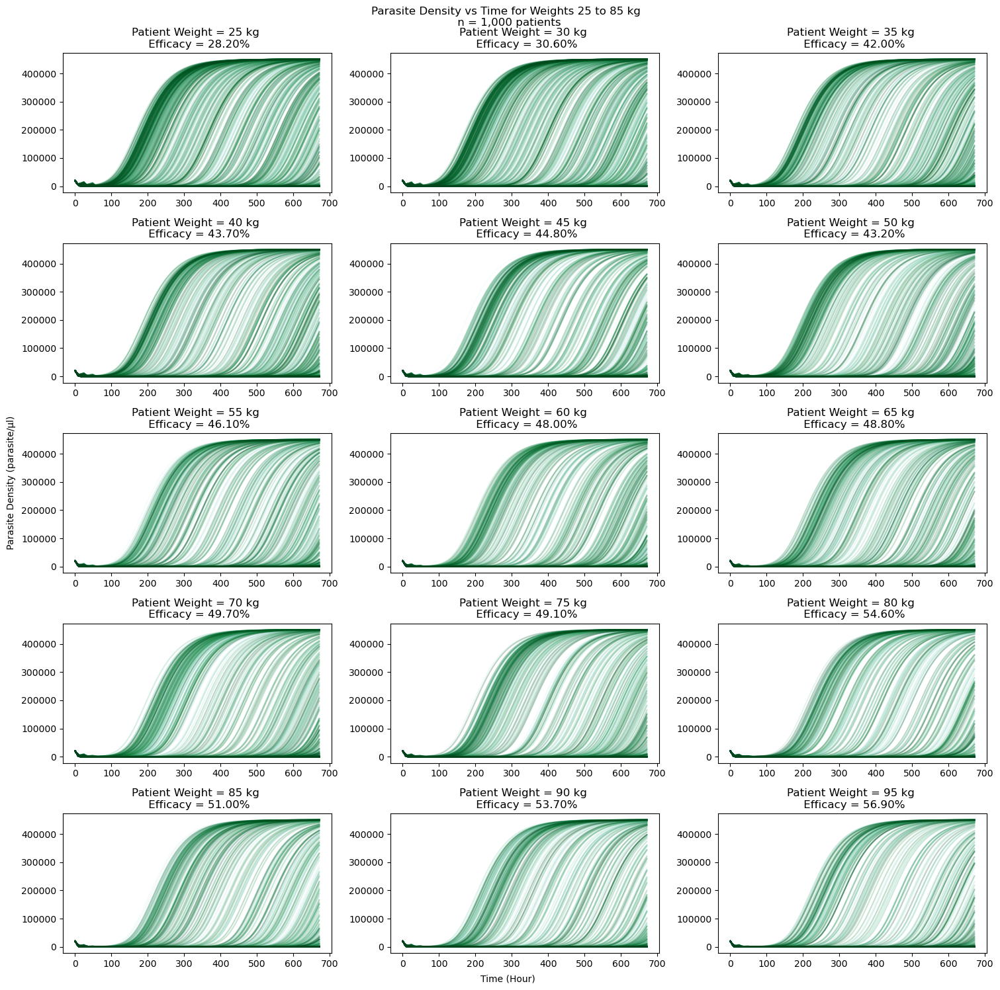

In [24]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#Define the number of unique PIDs
num_pids = len(df['PID'].unique())

# Create a colormap
# Create a colormap
colormap = plt.get_cmap('BuGn')  # Ensure compatibility with different Matplotlib versions
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)  # Normalize values to 0-1 range

nrows = 5
ncols = 3

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 15))

for i, df in enumerate(dataframes_results):
    row = i // ncols
    col = i % ncols
    ax = axs[row, col]
    for j, pid in enumerate(df['PID'].unique()):
        df_pid = df[df['PID'] == pid]
        color = colormap(norm(j))  # Normalize j for color mapping
        ax.plot(df_pid['HOUR'], df_pid['PARASITEDENSITY'], color=color, alpha=0.25)
    ax.set_title(f"Patient Weight = {weight_values[i]} kg \n Efficacy = {trial_efficacy[i]:.2f}%")

#Set X and Y Labels for the entire plot
fig.text(0.5, 0, 'Time (Hour)', ha='center', va='center')
fig.text(0, 0.5, 'Parasite Density (parasite/μl)', ha='center', va='center', rotation='vertical')
fig.suptitle("Parasite Density vs Time for Weights 25 to 85 kg \n n = 1,000 patients")
plt.savefig("pkpd_AL_weight_calibration_group_03_parasitedensity_01.png")
plt.tight_layout()
plt.show()

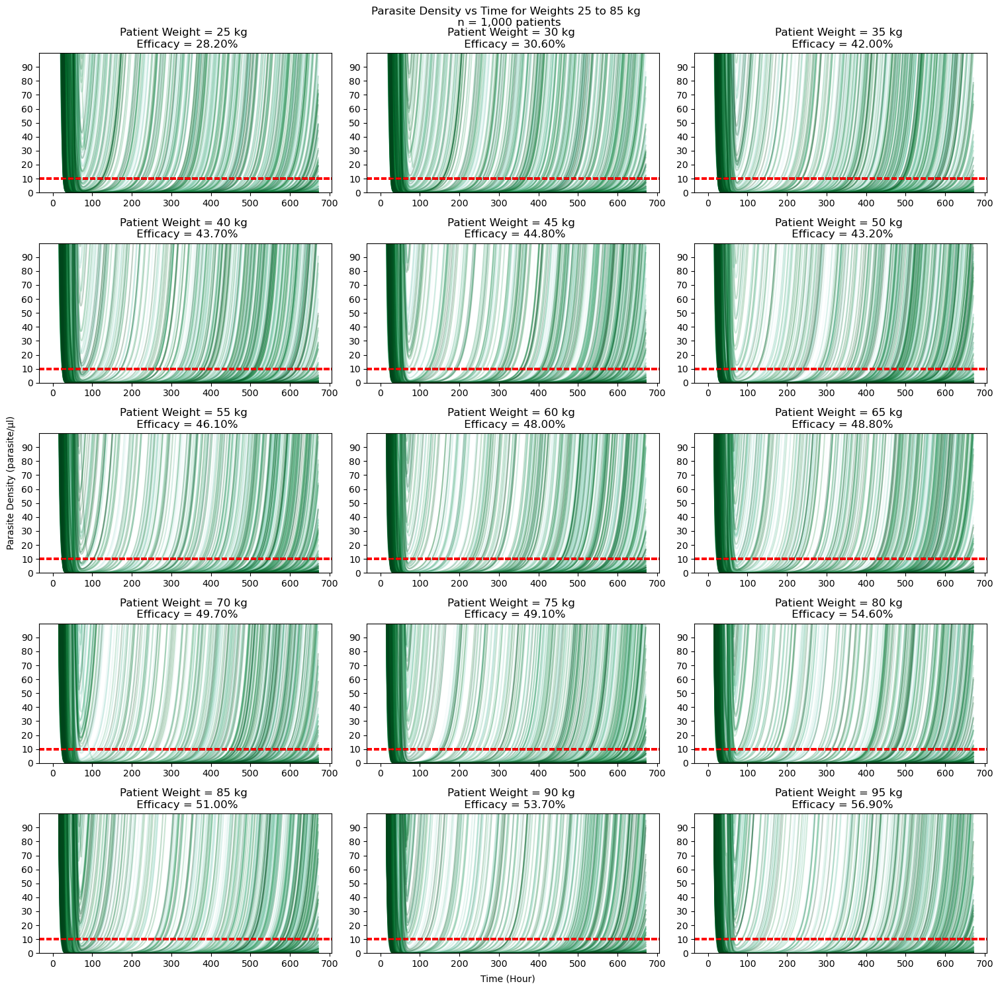

In [25]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#Define the number of unique PIDs
num_pids = len(df['PID'].unique())

# Create a colormap
# Create a colormap
colormap = plt.get_cmap('BuGn')  # Ensure compatibility with different Matplotlib versions
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)  # Normalize values to 0-1 range

nrows = 5
ncols = 3

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 15))

for i, df in enumerate(dataframes_results):
    row = i // ncols
    col = i % ncols
    ax = axs[row, col]
    for j, pid in enumerate(df['PID'].unique()):
        df_pid = df[df['PID'] == pid]
        color = colormap(norm(j))  # Normalize j for color mapping
        ax.plot(df_pid['HOUR'], df_pid['PARASITEDENSITY'], color=color, alpha=0.25)
        ax.axhline(y=10, color='Red', linestyle='--', alpha=0.5)
    ax.set_ylim(0, 100)
    ax.set_yticks(np.arange(0, 100, 10))
    ax.set_title(f"Patient Weight = {weight_values[i]} kg \n Efficacy = {trial_efficacy[i]:.2f}%")

#Set X and Y Labels for the entire plot
fig.text(0.5, 0, 'Time (Hour)', ha='center', va='center')
fig.text(0, 0.5, 'Parasite Density (parasite/μl)', ha='center', va='center', rotation='vertical')
fig.suptitle("Parasite Density vs Time for Weights 25 to 85 kg \n n = 1,000 patients")
plt.savefig("pkpd_AL_weight_calibration_group_03_parasitedensity_02.png")
plt.tight_layout()
plt.show()

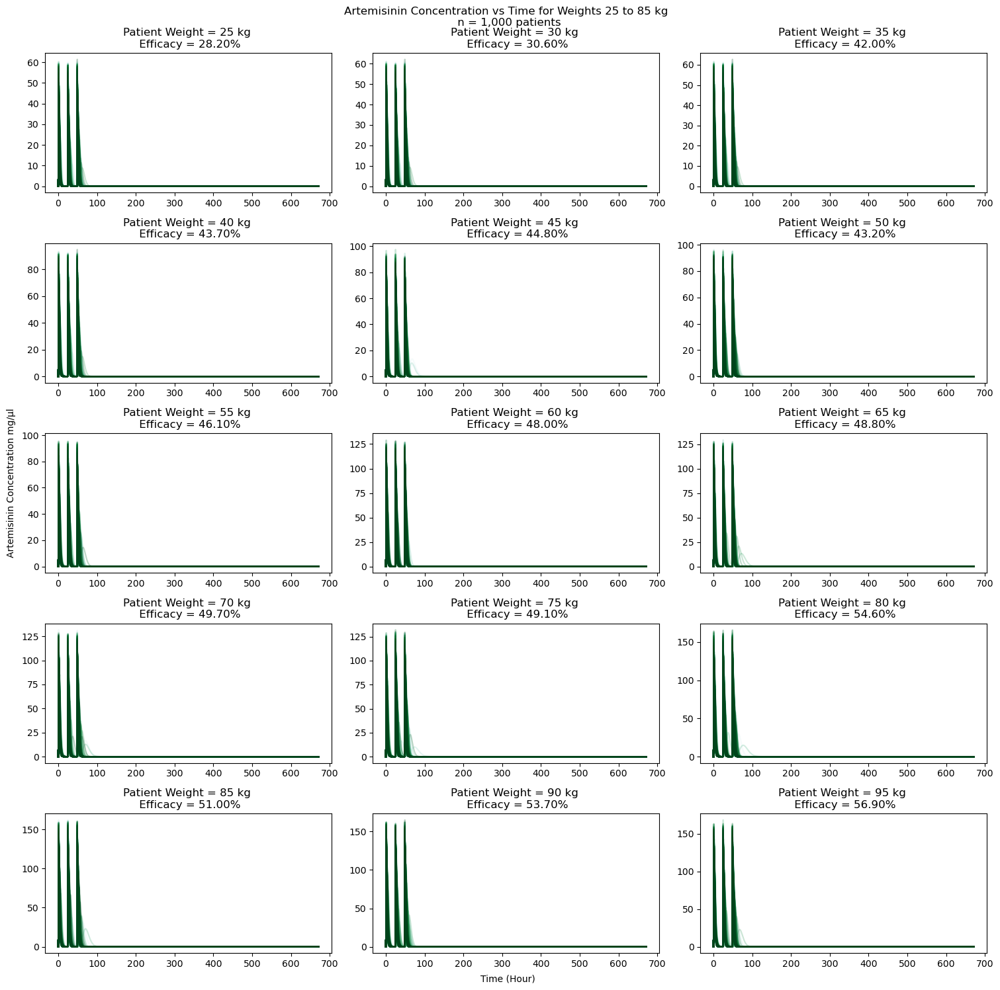

In [26]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#Define the number of unique PIDs
num_pids = len(df['PID'].unique())

# Create a colormap
colormap = plt.get_cmap('BuGn')  # Ensure compatibility with different Matplotlib versions
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)  # Normalize values to 0-1 range

nrows = 5
ncols = 3

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 15))

for i, df in enumerate(dataframes_results):
    row = i // ncols
    col = i % ncols
    ax = axs[row, col]
    for j, pid in enumerate(df['PID'].unique()):
        df_pid = df[df['PID'] == pid]
        color = colormap(norm(j))  # Normalize j for color mapping
        ax.plot(df_pid['HOUR'], df_pid['COMP2CONC_ART'], color= color, alpha=0.25)
    ax.set_title(f"Patient Weight = {weight_values[i]} kg \n Efficacy = {trial_efficacy[i]:.2f}%")


#Set X and Y Labels for the entire plot
fig.text(0.5, 0, 'Time (Hour)', ha='center', va='center')
fig.text(0, 0.5, 'Artemisinin Concentration mg/μl', ha='center', va='center', rotation='vertical')
fig.suptitle("Artemisinin Concentration vs Time for Weights 25 to 85 kg \n n = 1,000 patients")

plt.savefig("pkpd_AL_weight_calibration_group_03_art_conc.png")
plt.tight_layout()
plt.show()

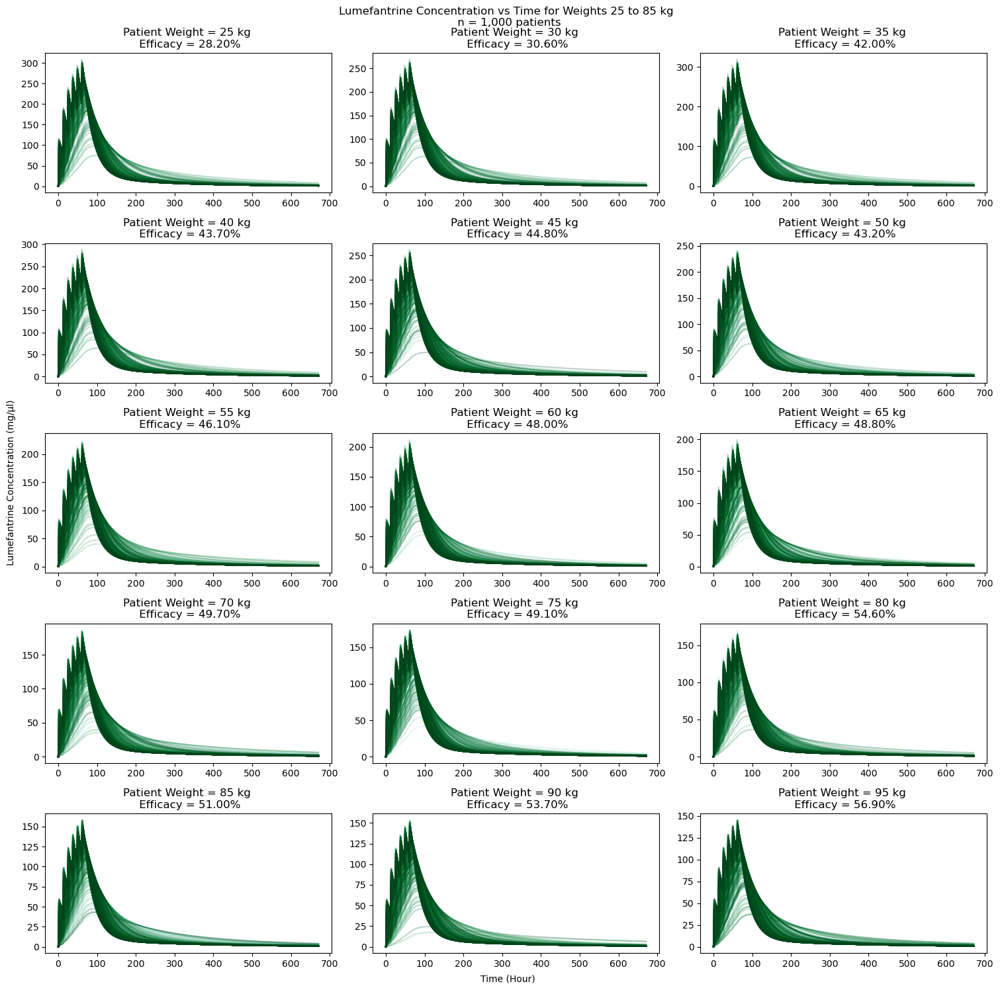

In [27]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Define the number of unique PIDs
num_pids = max(len(df['PID'].unique()) for df in dataframes_results)

# Create a colormap
colormap = plt.get_cmap('BuGn')  # Ensure compatibility with different Matplotlib versions
norm = plt.Normalize(vmin=0, vmax=num_pids - 1)  # Normalize values to 0-1 range

nrows = 5
ncols = 3
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 15))

for i, df in enumerate(dataframes_results):
    row = i // ncols
    col = i % ncols
    ax = axs[row, col]
    
    unique_pids = df['PID'].unique()
    for j, pid in enumerate(unique_pids):
        df_pid = df[df['PID'] == pid].copy()  # Avoid SettingWithCopyWarning
        df_pid['COMP2CONC_LUM'] /= 100  # Modify safely
        color = colormap(norm(j))  # Normalize j for color mapping
        ax.plot(df_pid['HOUR'], df_pid['COMP2CONC_LUM'], color=color, alpha=0.25)
    ax.set_title(f"Patient Weight = {weight_values[i]} kg \n Efficacy = {trial_efficacy[i]:.2f}%")


#Set X and Y Labels for the entire plot
fig.text(0.5, 0, 'Time (Hour)', ha='center', va='center')
fig.text(0, 0.5, 'Lumefantrine Concentration (mg/μl)', ha='center', va='center', rotation='vertical')
fig.suptitle("Lumefantrine Concentration vs Time for Weights 25 to 85 kg \n n = 1,000 patients")
# Add space between the super title and the subplots
plt.subplots_adjust(top=0.88)  # Adjust the top parameter to add space

plt.tight_layout()
plt.savefig("pkpd_AL_weight_calibration_group_03_lum_conc.png")
plt.show()
